<a href="https://colab.research.google.com/github/DevaFullStack/challenge_alura_store/blob/main/Analise_das_lojas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Challenge Alura Store: Análise de Dados das Lojas do senhor João

## Bem-vindo(a) ao Notebook de Análise de Dados!

Neste notebook, iremos realizar todo o processo de carregamento, tratamento, exploração e análise dos dados fornecidos no Challenge Alura Store. O objetivo é ajudar o senhor João, um empresário dono de quatro lojas, a decidir **qual loja ele deve vender** com base em métricas estratégicas de desempenho.

### 🔍 Sobre o Projeto

João deseja vender uma de suas lojas para investir em outro empreendimento. Para isso, precisamos analisar os dados de cada loja considerando as seguintes métricas:

- Faturamento total  
- Vendas por categoria  
- Avaliação média dos clientes  
- Produtos mais e menos vendidos  
- Frete médio  
- Faturamento mensal *(métrica adicional incluída)*  

Além disso, também realizaremos uma **análise geográfica** (desafio extra), buscando identificar padrões regionais que possam influenciar na decisão.

### 🧰 Estrutura deste Notebook

1. **Importação das bibliotecas necessárias**
2. **Carregamento e leitura do dataset**
3. **Tratamento inicial dos dados**
4. **Cálculo das métricas solicitadas**
5. **Análise geográfica (opcional)**
6. **Visualizações gráficas para melhor compreensão**
7. **Preparação dos resultados para o relatório final**

Vamos começar!

## ⚙️ Configuração Inicial do Ambiente

Antes de começarmos a trabalhar com os dados, vamos preparar o ambiente de análise. Para isso:

- Importaremos as bibliotecas necessárias para manipulação e visualização de dados;
- Definiremos os caminhos dos arquivos CSV com os dados de cada loja;
- Carregaremos os dados de todas as lojas em DataFrames individuais;
- Consolidaremos todos os dados em um único DataFrame chamado `todas_lojas`, incluindo uma nova coluna indicando a origem de cada registro (qual loja).

Essa estrutura nos permitirá analisar os dados de forma centralizada e comparar o desempenho de cada loja com facilidade.

In [ ]:
# Importa bibliotecas necessárias
import pandas as pd   # Para manipulação e análise de dados (ex: trabalhar com tabelas)
import matplotlib.pyplot as plt  # Para criar gráficos e visualizações
import seaborn as sns  # Para visualizações estatísticas
import folium

# Caminho dos arquivos CSV
url1 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_1.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_4.csv"


# Carrega os dados
loja1 = pd.read_csv(url1)
loja2 = pd.read_csv(url2)
loja3 = pd.read_csv(url3)
loja4 = pd.read_csv(url4)


# Cria uma lista com os DataFrames de cada loja
lojas = [loja1, loja2, loja3, loja4]

# Cria uma lista com os nomes de cada loja
nomes_lojas = ['Loja 1', 'Loja 2', 'Loja 3', 'Loja 4']


# Cria um DataFrame 'todas_lojas'
todas_lojas = pd.DataFrame()
for loja in range(len(lojas)):
  # Adiciona a coluna 'Loja' ao DataFrame 'todas_lojas'
  lojas[loja]['Loja'] = nomes_lojas[loja]
  # Concatena o DataFrame das lojas atuais com o 'todas_lojas'
  todas_lojas = pd.concat([todas_lojas, lojas[loja]], ignore_index=True)

## 🔍 Explorando o Conjunto de Dados

Com os dados de todas as lojas carregados e combinados em um único DataFrame chamado `todas_lojas`, podemos agora realizar uma inspeção inicial para entender melhor a estrutura do nosso conjunto de dados.

Vamos verificar:
- As primeiras linhas do DataFrame
- O número total de registros
- As colunas disponíveis
- Os tipos de dados de cada coluna

Essa análise inicial é essencial para identificar possíveis inconsistências ou peculiaridades nos dados antes de seguirmos com o tratamento e cálculo das métricas solicitadas.

In [ ]:
# Exibe as primeiras 5 linhas do DataFrame
print("Primeiras 5 linhas do DataFrame:")
print(todas_lojas.head())

# Exibe informações gerais sobre o DataFrame
print("\nInformações do DataFrame:")
print(todas_lojas.info())

# Exibe estatísticas descritivas das colunas numéricas
print("\nEstatísticas descritivas:")
print(todas_lojas.describe())

# Verifica se há valores nulos
print("\nValores nulos por coluna:")
print(todas_lojas.isnull().sum())

Primeiras 5 linhas do DataFrame:
                 Produto Categoria do Produto    Preço      Frete  \
0     Assistente virtual          eletronicos   219.08   9.249790   
1         Mesa de jantar               moveis   256.35  11.234305   
2      Jogo de tabuleiro           brinquedos   279.51  21.262681   
3            Micro-ondas     eletrodomesticos  1009.99  54.667344   
4  Cadeira de escritório               moveis   446.99  26.964689   

  Data da Compra        Vendedor Local da compra  Avaliação da compra  \
0     16/01/2021     Pedro Gomes              SP                    4   
1     18/05/2022  Beatriz Moraes              RJ                    1   
2     15/03/2021      João Souza              DF                    1   
3     03/05/2022      João Souza              RS                    4   
4     07/11/2020   Larissa Alves              MG                    5   

  Tipo de pagamento  Quantidade de parcelas    lat    lon    Loja  
0    cartao_credito                       8 -

## 💰 Cálculo do Faturamento Total por Loja

Uma das métricas mais importantes para a tomada de decisão é o **faturamento total por loja**, ou seja, o somatório dos valores de venda registrados em cada uma delas.

Nesta etapa, vamos agrupar os dados pelo nome da loja (`Loja`) e somar os valores da coluna `Preço` para obter o faturamento bruto de cada uma. O resultado será exibido de forma clara, com formatação em reais (R$) e separadores de milhar e casas decimais adequados à moeda brasileira.

In [ ]:
# Soma os a coluna preço de cada loja e armazena na variável 'faturamento'
faturamento = todas_lojas.groupby('Loja')['Preço'].sum()

# Exibe o faturamento formatado
print('Faturamento total de cada loja:')
for loja, valor in faturamento.items():
  print(f'{loja}: R$ {valor:,.2f}'.replace(',', 'X').replace('.', ',').replace('X', '.'))

Faturamento total de cada loja:
Loja 1: R$ 1.534.509,12
Loja 2: R$ 1.488.459,06
Loja 3: R$ 1.464.025,03
Loja 4: R$ 1.384.497,58


In [ ]:
cores_lojas = {
    'Loja 1': 'blue',
    'Loja 2': 'orange',
    'Loja 3': 'green',
    'Loja 4': 'red'
}

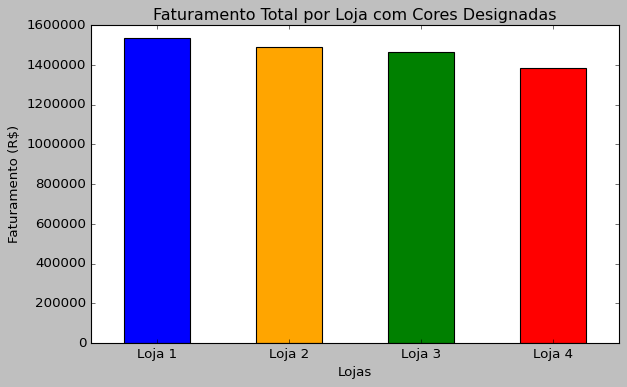

In [ ]:
# Configuração do estilo dos gráficos
plt.style.use('classic')

# Gráfico 1: Faturamento por loja (barras) com Cores Designadas
plt.figure(figsize=(8, 5))

# Obtém a lista de cores na ordem das lojas no índice de 'faturamento'
# Certifique-se de que a ordem das lojas no índice de faturamento
# corresponde à ordem que você deseja para as cores (Loja 1, Loja 2, etc.)
# Se a ordem não for garantida, você pode precisar ordenar 'faturamento' ou
# criar a lista de cores explicitamente com base nos nomes das lojas no índice.

# Exemplo garantindo a ordem das cores se o índice for 'Loja 1', 'Loja 2', etc.
cores_para_barras = [cores_lojas[loja] for loja in faturamento.index]


faturamento.plot(kind='bar', color=cores_para_barras) # Usa as cores ordenadas
plt.xlabel('Lojas')
plt.ylabel('Faturamento (R$)')
plt.title('Faturamento Total por Loja com Cores Designadas')
plt.xticks(rotation=0) # Alterei a rotação para 0 para melhor leitura
plt.tight_layout()
plt.show()


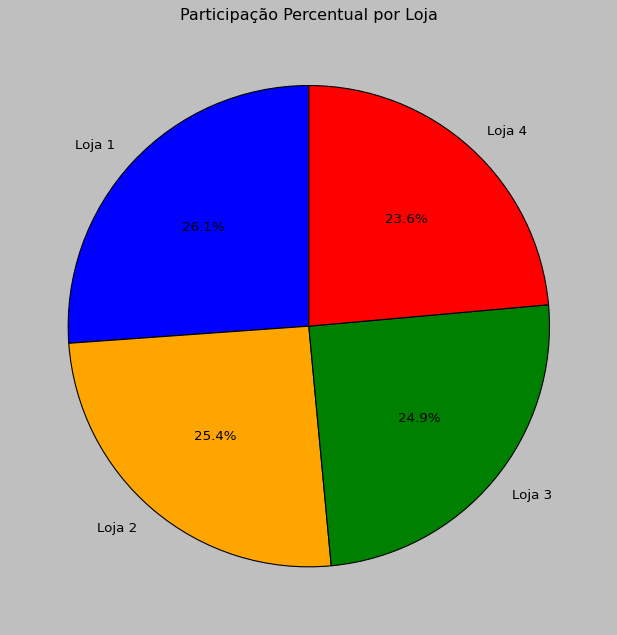

In [ ]:
# Configuração do estilo dos gráficos
plt.style.use('classic')

# Gráfico 2: Participação percentual no faturamento total (pizza) com Cores Designadas
plt.figure(figsize=(8, 8))

# Obtém a lista de cores na ordem das fatias (lojas no índice de faturamento)
cores_para_pizza = [cores_lojas[loja] for loja in faturamento.index]

faturamento.plot(kind='pie', autopct='%1.1f%%', startangle=90,
                 colors=cores_para_pizza) # Usa as cores ordenadas
plt.title('Participação Percentual por Loja')
plt.ylabel('')
plt.tight_layout()
plt.show()



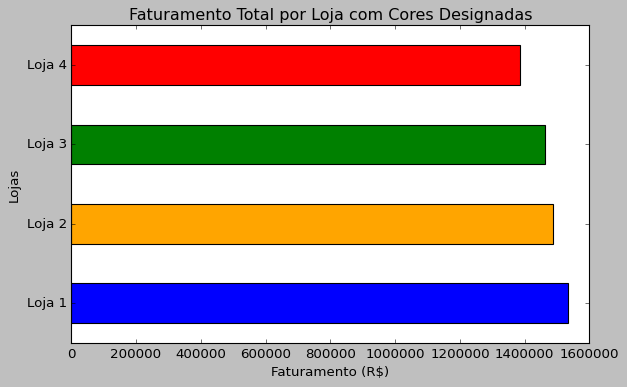

In [ ]:
# Gráfico de Barras Horizontais para o Faturamento Total por Loja com Cores Designadas
plt.figure(figsize=(8, 5))

# Obtém a lista de cores na ordem das lojas no índice de 'faturamento'
# É importante que a ordem das lojas no índice corresponda à ordem das cores desejada.
cores_para_barras_h = [cores_lojas[loja] for loja in faturamento.index]

faturamento.plot(kind='barh', color=cores_para_barras_h) # Usa as cores ordenadas
plt.xlabel('Faturamento (R$)')
plt.ylabel('Lojas')
plt.title('Faturamento Total por Loja com Cores Designadas')
plt.tight_layout()
plt.show()


## 🗓️ Análise do Faturamento Mensal por Loja

Para entender a evolução do desempenho de cada loja ao longo do tempo, vamos calcular e analisar o faturamento mensal. Esta métrica nos permitirá identificar padrões sazonais, tendências de crescimento ou declínio, e comparar a performance das lojas em diferentes períodos.

As etapas para realizar esta análise são as seguintes:

1.  **Converter a coluna de data:** Garantiremos que a coluna 'Data da Compra' esteja no formato de data e hora adequado para manipulação temporal.
2.  **Extrair o Mês:** Criaremos uma nova coluna que representará o mês e o ano de cada compra.
3.  **Calcular o Faturamento Mensal:** Utilizaremos a função `pivot_table` do pandas para calcular a soma dos valores de 'Preço' para cada combinação de 'Loja' e 'Mês'.
4.  **Ordenar os Meses:** Organizaremos as colunas dos meses em ordem cronológica para facilitar a visualização.
5.  **Exibir o Resultado:** Mostraremos a tabela resultante com o faturamento mensal de cada loja.

Com esta tabela, poderemos posteriormente gerar gráficos para visualizar a evolução do faturamento mensal de cada loja.


In [ ]:
# 1. Garanta que a coluna de data está em formato datetime
todas_lojas['Data da Compra'] = pd.to_datetime(todas_lojas['Data da Compra'], dayfirst=True)

# 2. Crie a coluna 'Mês' com base na data (ex: 2023-01-01)
todas_lojas['Mês'] = todas_lojas['Data da Compra'].dt.to_period('M')

# 4. Calcule o faturamento mensal por loja usando pivot_table
faturamento_mensal = todas_lojas.pivot_table(
    values='Preço',
    index='Loja',
    columns='Mês',
    aggfunc='sum'
)

# 5. Ordene os meses em ordem cronológica
faturamento_mensal = faturamento_mensal.sort_index(axis=1)

# 6. Exiba o resultado final
print("\nFaturamento Mensal por Loja:")
print(faturamento_mensal)


Faturamento Mensal por Loja:
Mês      2020-01   2020-02   2020-03   2020-04   2020-05   2020-06   2020-07  \
Loja                                                                           
Loja 1  44112.70  53405.54  42083.02  44888.34  51443.80  35062.24  46780.66   
Loja 2  41505.53  23184.97  40687.92  36862.31  33949.42  34741.62  31396.39   
Loja 3  31710.54  36769.81  40033.19  47124.45  34831.23  23285.27  44803.33   
Loja 4  25731.91  30507.49  38044.35  52656.70  42654.91  35804.36  35899.68   

Mês      2020-08   2020-09   2020-10  ...   2022-06   2022-07   2022-08  \
Loja                                  ...                                 
Loja 1  41501.80  40324.79  28179.04  ...  33313.04  36334.79  37061.35   
Loja 2  31297.17  41504.69  44358.25  ...  31665.37  31502.84  38903.79   
Loja 3  34500.91  35557.90  24742.78  ...  33864.18  40976.28  37062.62   
Loja 4  41609.71  37599.74  23596.86  ...  30109.26  19827.46  35734.09   

Mês      2022-09   2022-10   2022-11  

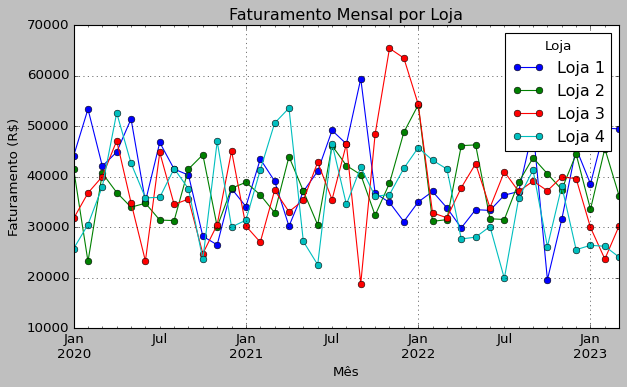

In [ ]:
# 7. (Opcional) Plote um gráfico para visualizar o faturamento
faturamento_mensal.T.plot(kind='line', marker='o', figsize=(8, 5))
plt.title('Faturamento Mensal por Loja')
plt.xlabel('Mês')
plt.ylabel('Faturamento (R$)')
plt.grid(True)
plt.legend(title='Loja')
plt.tight_layout()
plt.show()

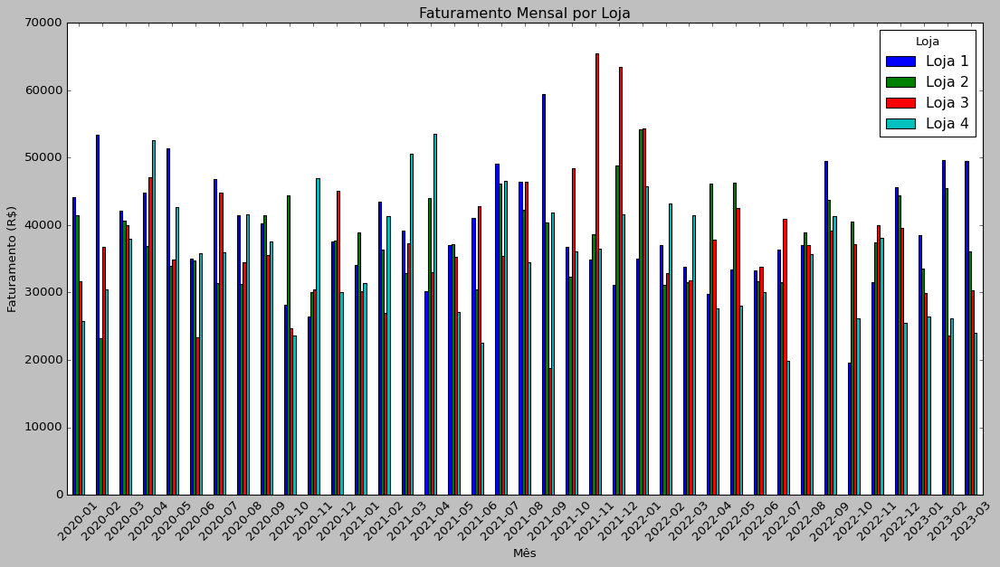

In [ ]:
# Gráfico de barras agrupadas para visualizar o faturamento mensal
faturamento_mensal.T.plot(kind='bar', figsize=(14, 8))
plt.title('Faturamento Mensal por Loja')
plt.xlabel('Mês')
plt.ylabel('Faturamento (R$)')
plt.xticks(rotation=45)
plt.legend(title='Loja')
plt.tight_layout()
plt.show()

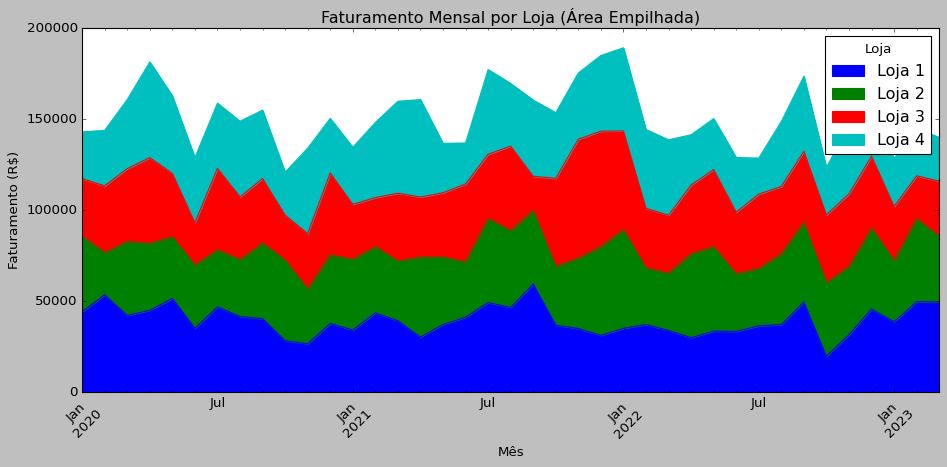

In [ ]:
# Gráfico de área empilhada para visualizar o faturamento mensal
faturamento_mensal.T.plot(kind='area', stacked=True, figsize=(12, 6))
plt.title('Faturamento Mensal por Loja (Área Empilhada)')
plt.xlabel('Mês')
plt.ylabel('Faturamento (R$)')
plt.xticks(rotation=45)
plt.legend(title='Loja')
plt.tight_layout()
plt.show()

## 📦 Distribuição das Vendas por Categoria

Entender quais categorias de produtos mais contribuem para o faturamento de cada loja é essencial para avaliar seu desempenho. Nesta etapa, vamos analisar a distribuição das vendas por categoria para cada uma das lojas.

Para isso:
- Agruparemos os dados por `Loja` e `Categoria`;
- Calcularemos o total de vendas (soma dos preços) em cada categoria;
- Visualizaremos os resultados de forma clara, permitindo comparar o desempenho entre as lojas e suas respectivas categorias de produtos.

In [ ]:
# Calcula o total de vendas por categoria em cada loja
vendas_por_categoria = todas_lojas.groupby(['Loja', 'Categoria do Produto'])['Preço'].sum().unstack(fill_value=0)

# Exibe o resultado formatado
print("Faturamento total por categoria nas lojas:")
print(vendas_por_categoria.applymap(lambda x: f'R$ {x:,.2f}'.replace(',', 'X').replace('.', ',').replace('X', '.')))

Faturamento total por categoria nas lojas:
Categoria do Produto    brinquedos eletrodomesticos    eletronicos  \
Loja                                                                 
Loja 1                R$ 23.993,78    R$ 484.913,36  R$ 572.659,23   
Loja 2                R$ 21.262,21    R$ 464.758,13  R$ 547.773,71   
Loja 3                R$ 25.869,20    R$ 438.984,89  R$ 547.699,92   
Loja 4                R$ 27.015,67    R$ 377.680,65  R$ 545.966,86   

Categoria do Produto esporte e lazer instrumentos musicais        livros  \
Loja                                                                       
Loja 1                  R$ 52.387,55         R$ 121.731,69  R$ 11.713,92   
Loja 2                  R$ 46.326,09         R$ 139.987,03  R$ 13.454,35   
Loja 3                  R$ 47.456,10         R$ 103.174,45  R$ 12.664,70   
Loja 4                  R$ 44.465,65         R$ 100.136,50  R$ 12.427,77   

Categoria do Produto         moveis utilidades domesticas  
Loja               

/tmp/ipython-input-13-2533384730.py:6: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  print(vendas_por_categoria.applymap(lambda x: f'R$ {x:,.2f}'.replace(',', 'X').replace('.', ',').replace('X', '.')))


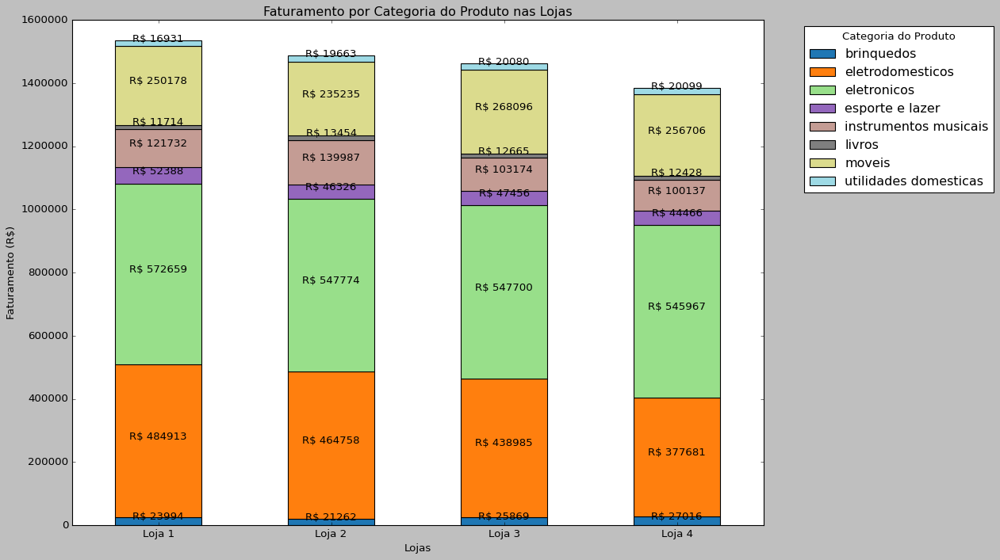

In [ ]:
# Opcional: gráfico de barras para visualizar as categorias - Melhorado (Rótulos Brancos no Centro e Padding)
ax = vendas_por_categoria.plot(
    kind='bar',
    stacked=True,
    figsize=(16, 9),
    title='Faturamento por Categoria do Produto nas Lojas',
    colormap='tab20' # Mantém um mapa de cores com boa distinção
)
plt.ylabel('Faturamento (R$)')
plt.xlabel('Lojas')
plt.xticks(rotation=0)
plt.legend(title='Categoria do Produto', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Adicionar rótulos de dados no centro dos segmentos com cor branca e padding aumentado
for container in ax.containers:
    ax.bar_label(container, fmt='R$ %.0f', label_type='center', color='black', padding=5) # Rótulos brancos no centro com mais padding

plt.show()

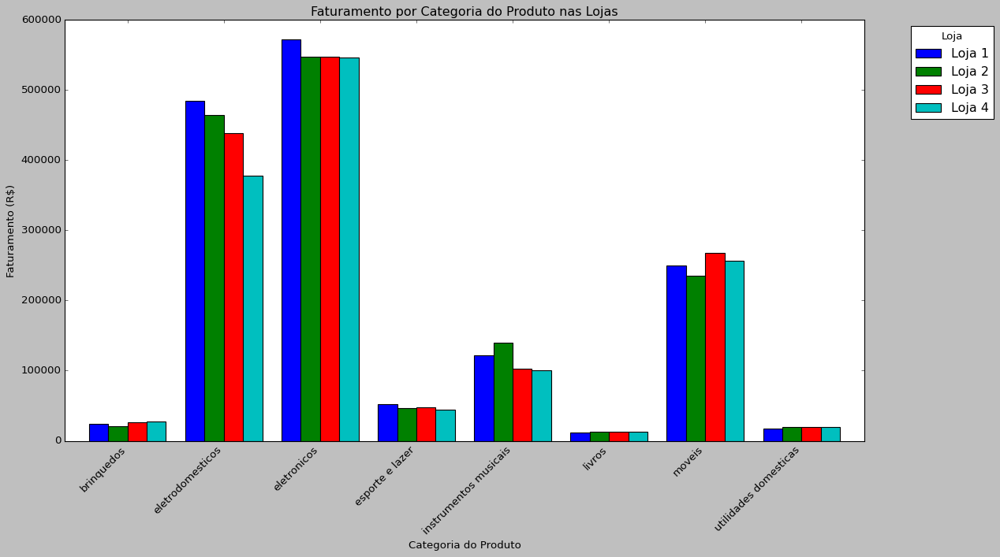

In [ ]:
# Gráfico de Barras Agrupadas para o Faturamento por Categoria nas Lojas
ax = vendas_por_categoria.T.plot(kind='bar', figsize=(16, 9), width=0.8) # Transpõe e ajusta largura das barras
plt.ylabel('Faturamento (R$)')
plt.xlabel('Categoria do Produto')
plt.title('Faturamento por Categoria do Produto nas Lojas')
plt.xticks(rotation=45, ha='right') # Rotação para rótulos mais longos
plt.legend(title='Loja', bbox_to_anchor=(1.05, 1), loc='upper left') # Legenda fora do gráfico
plt.tight_layout()
plt.show()


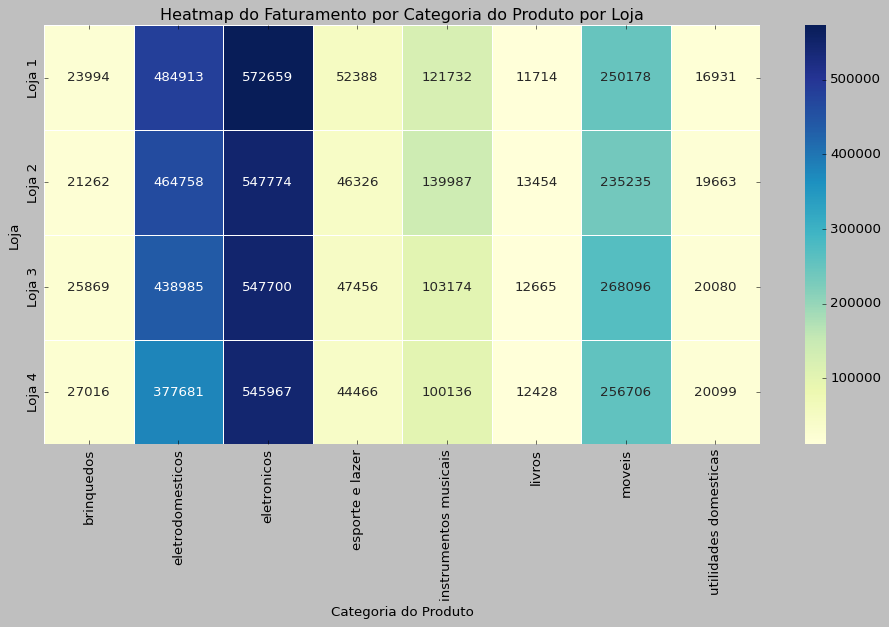

In [ ]:
# Gráfico de Heatmap para o Faturamento por Categoria nas Lojas

plt.figure(figsize=(12, 8))

# Usando o DataFrame vendas_por_categoria que já está pivotado
sns.heatmap(vendas_por_categoria, annot=True, fmt=".0f", cmap="YlGnBu", linewidths=.5) # heatmap
plt.title('Heatmap do Faturamento por Categoria do Produto por Loja')
plt.xlabel('Categoria do Produto')
plt.ylabel('Loja')
plt.tight_layout()
plt.show()




## ⭐ Avaliação Média por Loja

A satisfação do cliente é um fator importante no desempenho de uma loja. A métrica de **Avaliação Média** nos permite entender como os clientes estão percebendo a experiência de compra em cada uma das unidades.

Nesta etapa, calcularemos a média das notas de avaliação (`Avaliação da compra`) para cada loja. Um valor de avaliação mais alto indica uma maior satisfação geral dos clientes.




In [ ]:
media_avaliacao = todas_lojas.groupby('Loja')['Avaliação da compra'].mean()

print('Avaliação média por loja:')
for loja, valor in media_avaliacao.items():
  print(f'{loja}: {valor:,.2f}')

Avaliação média por loja:
Loja 1: 3.98
Loja 2: 4.04
Loja 3: 4.05
Loja 4: 4.00


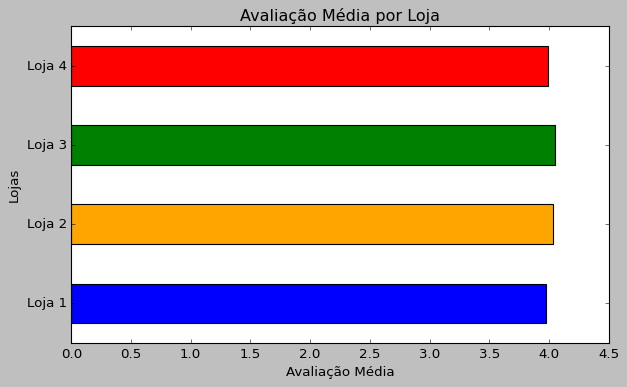

In [ ]:
# Gráfico de Barras Horizontais da Média de Avaliação por Loja
plt.figure(figsize=(8, 5))

# Obtém a lista de cores na ordem das lojas no índice de 'media_avaliacao'
cores_para_barras_h_avaliacao = [cores_lojas[loja] for loja in media_avaliacao.index]

media_avaliacao.plot(kind='barh', color=cores_para_barras_h_avaliacao)
plt.xlabel('Avaliação Média')
plt.ylabel('Lojas')
plt.title('Avaliação Média por Loja')
plt.tight_layout()
plt.show()

In [ ]:
# Gráfico 4: Tabela Colorida da Média de Avaliação por Loja

# Converte a Series para DataFrame para estilização
media_avaliacao_df = media_avaliacao.reset_index()
media_avaliacao_df.columns = ['Loja', 'Avaliação Média']

# Aplica um estilo de cor de fundo baseado nos valores da 'Avaliação Média'
styled_table = media_avaliacao_df.style.background_gradient(subset=['Avaliação Média'], cmap='YlGn') # Yellow-Green colormap
styled_table = styled_table.format({'Avaliação Média': '{:.2f}'}) # Formata os números
styled_table = styled_table.set_properties(**{'font-size': '10pt', 'border': '1px solid black'}) # Adiciona bordas e ajusta fonte

display(styled_table)



,Loja,Avaliação Média
0,Loja 1,3.98
1,Loja 2,4.04
2,Loja 3,4.05
3,Loja 4,4.00


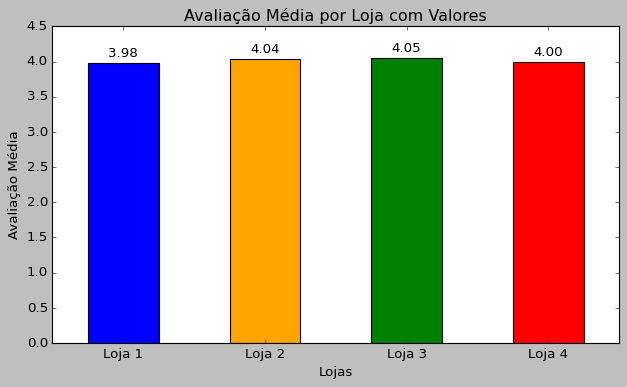

In [ ]:
# Gráfico 1: Gráfico de Barras Verticais da Média de Avaliação com Anotações
plt.figure(figsize=(8, 5))

cores_para_barras_avaliacao = [cores_lojas[loja] for loja in media_avaliacao.index]

ax = media_avaliacao.plot(kind='bar', color=cores_para_barras_avaliacao) # Captura o objeto Axes
plt.xlabel('Lojas')
plt.ylabel('Avaliação Média')
plt.title('Avaliação Média por Loja com Valores')
plt.xticks(rotation=0)

# Adiciona anotações de valor em cima de cada barra
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', padding=3) # Formata com 2 casas decimais e adiciona padding

plt.tight_layout()
plt.show()



## 📦 Produtos Mais e Menos Vendidos por Loja

Entender quais produtos têm maior e menor saída em cada loja nos fornece insights valiosos sobre as preferências dos clientes e o desempenho do inventário. Esta análise pode ajudar a identificar produtos de sucesso que podem ser promovidos e produtos com baixo desempenho que podem precisar de atenção ou serem descontinuados.

Nesta seção, vamos identificar:
- O produto mais vendido em cada loja.
- O produto menos vendido em cada loja.

Para isso, contaremos a frequência de venda de cada produto dentro de cada loja e identificaremos aqueles com a maior e menor contagem.



In [ ]:
# 3 Produtos mais e menos vendidos por loja

# Assumindo que 'lojas' é a lista de DataFrames e 'nomes_lojas' é a lista de nomes
# E que ambas as listas foram definidas e executadas antes deste ponto no notebook.

# Itera usando o índice para obter o DataFrame e o nome
for i in range(len(lojas)):
  nome_loja = nomes_lojas[i] # Pega o nome da loja da lista nomes_lojas
  df_loja = lojas[i]       # Pega o DataFrame da lista lojas

  print(f"--- {nome_loja} ---")

  # Verifica se o DataFrame não está vazio antes de tentar calcular value_counts()
  if not df_loja.empty:
      # Conta a frequência de cada produto na loja atual
      produtos = df_loja['Produto'].value_counts()

      # Identifica os 3 produtos mais vendidos
      tres_mais_vendidos = produtos.head(3)

      # Identifica os 3 produtos menos vendidos
      tres_menos_vendidos = produtos.tail(3)


      print("  3 Produtos Mais Vendidos:")
      if not tres_mais_vendidos.empty:
          for produto, contagem in tres_mais_vendidos.items():
              print(f"    - {produto}: {contagem} unidades")
      else:
          print("    Não há dados de vendas de produtos suficientes.")

      print("\n  3 Produtos Menos Vendidos:")
      if not tres_menos_vendidos.empty:
          for produto, contagem in tres_menos_vendidos.items():
              print(f"    - {produto}: {contagem} unidades")
      else:
          print("    Não há dados de vendas de produtos suficientes.")
  else:
      print("  DataFrame vazio. Não há dados de vendas para esta loja.")


  print("-" * (len(nome_loja) + 6) + "\n")



--- Loja 1 ---
  3 Produtos Mais Vendidos:
    - Micro-ondas: 60 unidades
    - TV Led UHD 4K: 60 unidades
    - Guarda roupas: 60 unidades

  3 Produtos Menos Vendidos:
    - Panela de pressão: 35 unidades
    - Headset: 33 unidades
    - Celular ABXY: 33 unidades
------------

--- Loja 2 ---
  3 Produtos Mais Vendidos:
    - Iniciando em programação: 65 unidades
    - Micro-ondas: 62 unidades
    - Bateria: 61 unidades

  3 Produtos Menos Vendidos:
    - Mesa de jantar: 34 unidades
    - Impressora: 34 unidades
    - Jogo de tabuleiro: 32 unidades
------------

--- Loja 3 ---
  3 Produtos Mais Vendidos:
    - Kit banquetas: 57 unidades
    - Mesa de jantar: 56 unidades
    - Cama king: 56 unidades

  3 Produtos Menos Vendidos:
    - Mochila: 36 unidades
    - Micro-ondas: 36 unidades
    - Blocos de montar: 35 unidades
------------

--- Loja 4 ---
  3 Produtos Mais Vendidos:
    - Cama box: 62 unidades
    - Faqueiro: 59 unidades
    - Dashboards com Power BI: 56 unidades

  3 Produt

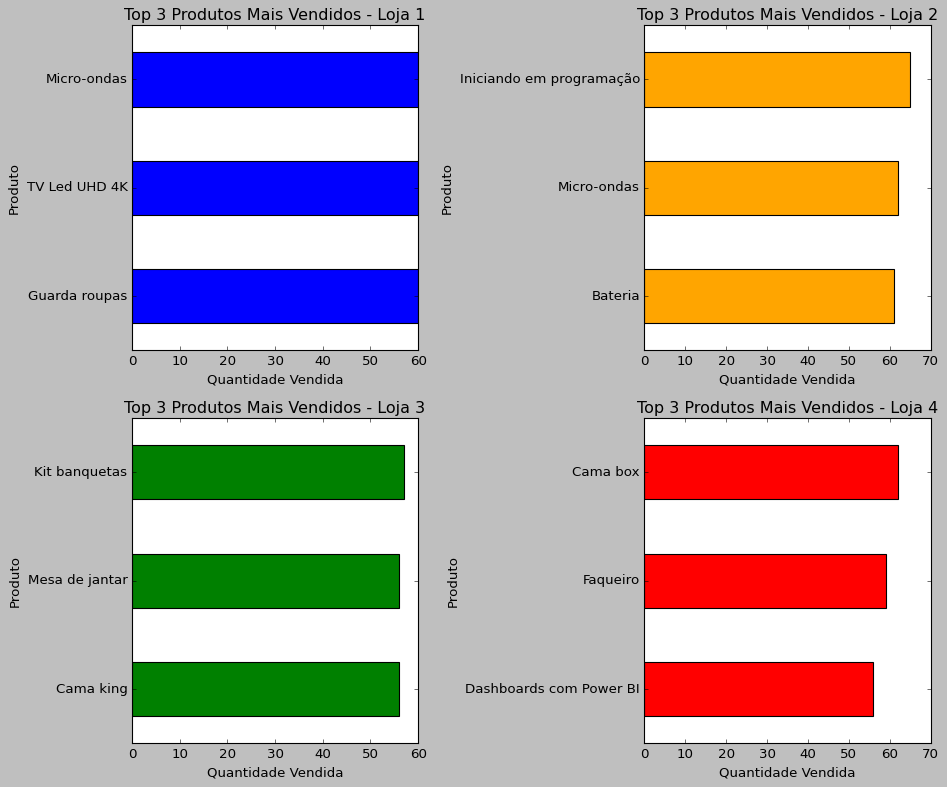

In [ ]:
# Visualização 2: Gráficos de Barras dos 3 Produtos Mais Vendidos por Loja (Múltiplos Gráficos)

# Use o dicionário lojas para iterar
lojas_dict = {
    'Loja 1': loja1,
    'Loja 2': loja2,
    'Loja 3': loja3,
    'Loja 4': loja4
}

n_cols = 2
n_rows = (len(lojas_dict) + n_cols - 1) // n_cols

plt.figure(figsize=(12, n_rows * 5))

for i, (nome_loja, df_loja) in enumerate(lojas_dict.items()):
    plt.subplot(n_rows, n_cols, i + 1)

    if not df_loja.empty:
        produtos = df_loja['Produto'].value_counts()
        tres_mais_vendidos = produtos.head(3)

        if not tres_mais_vendidos.empty:
            tres_mais_vendidos.plot(kind='barh', color=cores_lojas[nome_loja]) # Cor da loja
            plt.title(f'Top 3 Produtos Mais Vendidos - {nome_loja}')
            plt.xlabel('Quantidade Vendida')
            plt.ylabel('Produto')
            plt.gca().invert_yaxis() # Inverte o eixo y para o mais vendido ficar no topo
        else:
            plt.text(0.5, 0.5, "Sem dados de produtos", horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
            plt.title(f'Top 3 Produtos Mais Vendidos - {nome_loja}')
            plt.axis('off')
    else:
        plt.text(0.5, 0.5, "DataFrame vazio", horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
        plt.title(f'Top 3 Produtos Mais Vendidos - {nome_loja}')
        plt.axis('off')


plt.tight_layout()
plt.show()



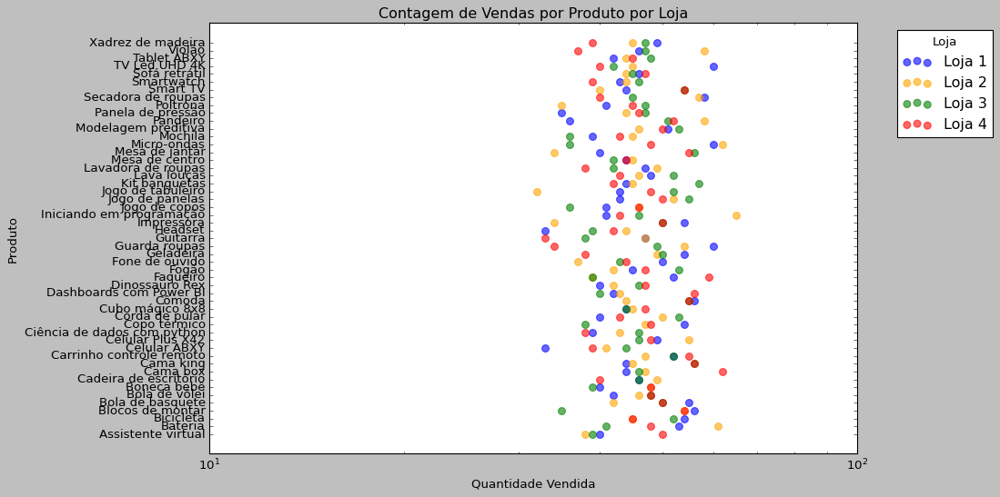

In [ ]:
# Visualização 5: Gráfico de Dispersão da Contagem de Vendas de Produtos por Loja (com Cores das Lojas)

plt.figure(figsize=(14, 7))

# Calcular a contagem de vendas de cada produto em cada loja
contagem_por_loja_produto = todas_lojas.groupby(['Loja', 'Produto']).size().reset_index(name='Quantidade Vendida')

# Plota um ponto para cada produto em cada loja
for loja in contagem_por_loja_produto['Loja'].unique():
    dados_loja = contagem_por_loja_produto[contagem_por_loja_produto['Loja'] == loja]
    plt.scatter(dados_loja['Quantidade Vendida'], dados_loja['Produto'],
                s=50, # Tamanho dos pontos
                color=cores_lojas.get(loja, 'grey'), # Cor da loja
                alpha=0.6, # Transparência
                label=loja)


plt.xlabel('Quantidade Vendida')
plt.ylabel('Produto')
plt.title('Contagem de Vendas por Produto por Loja')
plt.xscale('log') # Escala logarítmica pode ser útil
plt.legend(title='Loja', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, axis='x', linestyle='--')
plt.tight_layout()
plt.show()


## 🚚 Frete Médio por Loja

O custo do frete pode influenciar a decisão de compra do cliente e impactar a rentabilidade das lojas. Nesta seção, vamos calcular o **frete médio** para cada loja. Analisar esta métrica nos ajudará a entender se há diferenças significativas nos custos de frete entre as unidades e como isso pode estar afetando o desempenho.




In [ ]:
# Calcula o frete médio por loja
frete_medio_por_loja = todas_lojas.groupby('Loja')['Frete'].mean()

# Exibe o frete médio formatado
print('Frete médio por loja:')
for loja, valor in frete_medio_por_loja.items():
  print(f'{loja}: R$ {valor:,.2f}'.replace(',', 'X').replace('.', ',').replace('X', '.'))



Frete médio por loja:
Loja 1: R$ 34,69
Loja 2: R$ 33,62
Loja 3: R$ 33,07
Loja 4: R$ 31,28


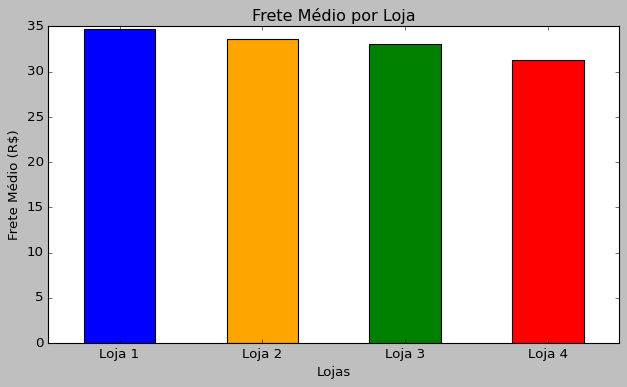

In [ ]:
# Gráfico 1: Gráfico de Barras Verticais do Frete Médio por Loja
plt.figure(figsize=(8, 5))

# Obtém as cores na ordem correta das lojas
cores_para_barras_frete = [cores_lojas[loja] for loja in frete_medio_por_loja.index]

frete_medio_por_loja.plot(kind='bar', color=cores_para_barras_frete)
plt.xlabel('Lojas')
plt.ylabel('Frete Médio (R$)')
plt.title('Frete Médio por Loja')
plt.xticks(rotation=0) # Rótulos das lojas retos
plt.tight_layout()
plt.show()



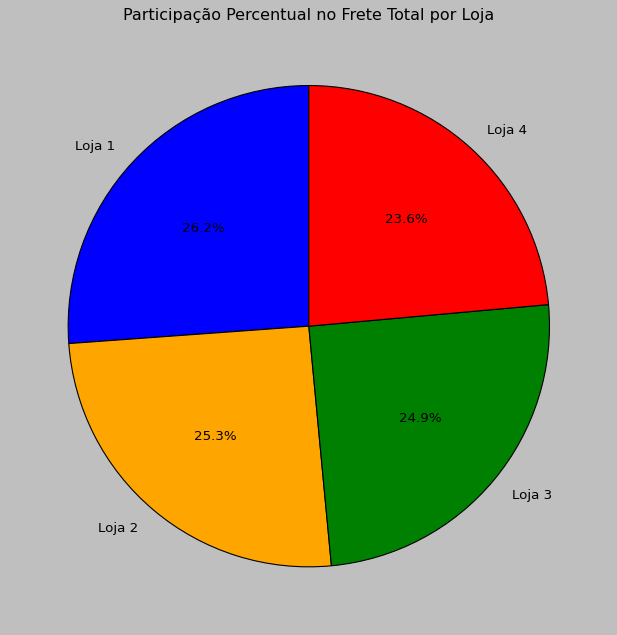

In [ ]:
# Calcula o frete total por loja
frete_total_por_loja = todas_lojas.groupby('Loja')['Frete'].sum()

# Gráfico de Pizza da Participação Percentual no Frete Total por Loja
plt.figure(figsize=(8, 8))

# Obtém as cores na ordem correta das lojas
cores_para_pizza_frete = [cores_lojas[loja] for loja in frete_total_por_loja.index]

frete_total_por_loja.plot(kind='pie', autopct='%1.1f%%', startangle=90,
                          colors=cores_para_pizza_frete) # Usa as cores designadas
plt.title('Participação Percentual no Frete Total por Loja')
plt.ylabel('') # Remove o rótulo padrão do eixo y
plt.tight_layout()
plt.show()


## 📍 Análise Geográfica das Vendas (Extra)

Esta seção explora as informações geográficas dos dados de venda para entender a distribuição espacial das compras e identificar possíveis padrões relacionados à localização. Utilizando as coordenadas de latitude e longitude, podemos visualizar onde as vendas ocorrem e analisar se a localização influencia o desempenho das lojas.

**Objetivos:**

- Mapear a localização das vendas de cada loja.
- Visualizar a concentração de vendas em diferentes áreas.
- Explorar possíveis relações entre a localização geográfica e métricas como faturamento e avaliação.

**Ferramentas:**

Utilizaremos a biblioteca Matplotlib para gerar gráficos de dispersão que visualizam a distribuição das vendas com base nas coordenadas geográficas. Podemos colorir os pontos por loja para entender a área de atuação de cada uma.


Realizando análise geográfica...


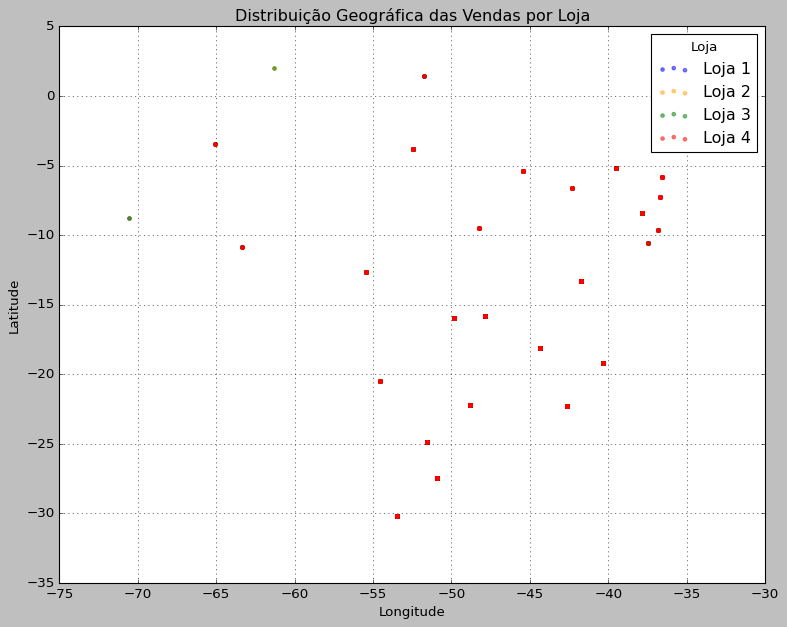

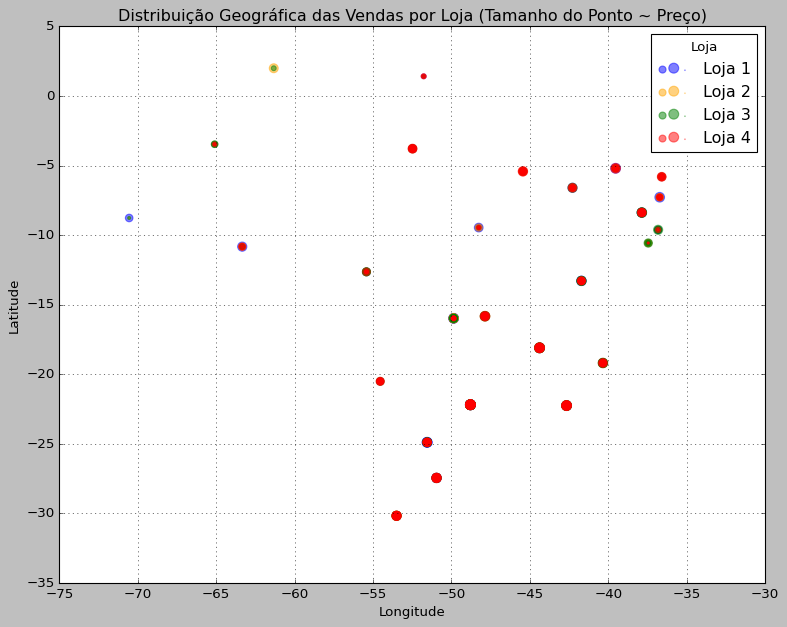

In [ ]:
# Análise Geográfica das Vendas (Extra)

# Verificar se as colunas 'lat' e 'lon' existem no DataFrame 'todas_lojas'
if 'lat' in todas_lojas.columns and 'lon' in todas_lojas.columns:

    print("Realizando análise geográfica...")

    # Gráfico de Dispersão das Vendas por Localização (Colorido por Loja)
    plt.figure(figsize=(10, 8))

    # Obtém a lista de lojas únicas
    lojas_unicas = todas_lojas['Loja'].unique()

    for loja in lojas_unicas:
        # Filtra os dados para a loja atual
        dados_loja = todas_lojas[todas_lojas['Loja'] == loja]

        # Plota os pontos de dispersão para as vendas da loja
        plt.scatter(dados_loja['lon'], dados_loja['lat'],
                    s=10, # Tamanho do ponto
                    alpha=0.5, # Transparência
                    label=loja,
                    color=cores_lojas.get(loja, 'grey')) # Usa a cor da loja se definida, senão cinza


    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title('Distribuição Geográfica das Vendas por Loja')
    plt.legend(title='Loja')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


    # Opcional: Gráfico de Dispersão com Tamanho do Ponto Representando o Preço
    plt.figure(figsize=(10, 8))

    for loja in lojas_unicas:
        dados_loja = todas_lojas[todas_lojas['Loja'] == loja]
        plt.scatter(dados_loja['lon'], dados_loja['lat'],
                    s=dados_loja['Preço'] / 50, # Tamanho do ponto proporcional ao preço (ajuste o divisor)
                    alpha=0.5,
                    label=loja,
                    color=cores_lojas.get(loja, 'grey'))

    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title('Distribuição Geográfica das Vendas por Loja (Tamanho do Ponto ~ Preço)')
    plt.legend(title='Loja')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


    # Você pode adicionar mais análises aqui, como:
    # - Heatmaps (usando seaborn.kdeplot ou histogram2d)
    # - Análise de agrupamento geográfico (se apropriado)
    # - Integração com Folium para mapas interativos (requer mais código)

else:
    print("As colunas 'lat' ou 'lon' não foram encontradas no DataFrame 'todas_lojas'. Não foi possível realizar a análise geográfica.")



In [ ]:
# Análise Geográfica Interativa com Folium (Extra Avançado) - Tentativa de Legenda Refinada

# Verificar se as colunas 'lat' e 'lon' existem
if 'lat' in todas_lojas.columns and 'lon' in todas_lojas.columns:

    print("Criando mapas interativos com Folium...")

    import folium
    from folium.plugins import HeatMap
    from branca.element import Template, Element

    # Crie um mapa base.
    media_lat = todas_lojas['lat'].mean()
    media_lon = todas_lojas['lon'].mean()

    # 1. Mapa de Pontos das Vendas (Colorido por Loja)

    mapa_pontos = folium.Map(location=[media_lat, media_lon], zoom_start=10)

    # Adicione marcadores para cada venda, coloridos por loja
    for index, row in todas_lojas.iterrows():
        folium.CircleMarker(
            location=[row['lat'], row['lon']],
            radius=3,
            color=cores_lojas.get(row['Loja'], 'grey'),
            fill=True,
            fill_color=cores_lojas.get(row['Loja'], 'grey'),
            fill_opacity=0.6,
            tooltip=f"Loja: {row['Loja']}<br>Produto: {row['Produto']}<br>Preço: R$ {row['Preço']:.2f}"
        ).add_to(mapa_pontos)

    # Adicionar Legenda ao Mapa de Pontos (usando HTML/CSS refinado)
    legend_html_refined = """
     <div style="position: fixed;
                 bottom: 20px; left: 20px; width: 150px; height: 120px;
                 border:1px solid grey; z-index: 9998; font-size:12px;
                 background-color:white; opacity:0.9; padding: 5px;">
       <b>Legenda - Lojas</b> <br>
       &nbsp; <span style="display:inline-block; width:12px; height:12px; background-color:""" + cores_lojas.get('Loja 1', 'grey') + """; border:1px solid grey;"></span> Loja 1 <br>
       &nbsp; <span style="display:inline-block; width:12px; height:12px; background-color:""" + cores_lojas.get('Loja 2', 'grey') + """; border:1px solid grey;"></span> Loja 2 <br>
       &nbsp; <span style="display:inline-block; width:12px; height:12px; background-color:""" + cores_lojas.get('Loja 3', 'grey') + """; border:1px solid grey;"></span> Loja 3 <br>
       &nbsp; <span style="display:inline-block; width:12px; height:12px; background-color:""" + cores_lojas.get('Loja 4', 'grey') + """; border:1px solid grey;"></span> Loja 4
     </div>
     """

    mapa_pontos.get_root().add_child(Element(legend_html_refined))


    print("Mapa de Pontos das Vendas (com Legenda - Refinada):")
    display(mapa_pontos)


    # (Os Heatmaps permanecem os mesmos sem legendas de intensidade padrão)

    # 2. Mapa de Calor (Heatmap) da Concentração de Vendas
    dados_heatmap = todas_lojas[['lat', 'lon']].values.tolist()
    mapa_heatmap = folium.Map(location=[media_lat, media_lon], zoom_start=10, tiles='CartoDb Positron')
    HeatMap(dados_heatmap).add_to(mapa_heatmap)
    title_html = """
                 <div style="position: fixed; top: 10px; right: 10px; width: 200px; height: 30px; z-index:9999; font-size:14px; font-weight:bold;">
                 Concentração de Vendas (Densidade de Pontos)
                 </div>
                 """
    mapa_heatmap.get_root().add_child(Element(title_html))
    print("\nMapa de Calor da Concentração de Vendas:")
    display(mapa_heatmap)


    # 3. Opcional: Mapa de Calor Ponderado por Preço
    if 'Preço' in todas_lojas.columns:
        dados_heatmap_preco = todas_lojas[['lat', 'lon', 'Preço']].values.tolist()
        mapa_heatmap_preco = folium.Map(location=[media_lat, media_lon], zoom_start=10, tiles='CartoDb Positron')
        HeatMap(dados_heatmap_preco).add_to(mapa_heatmap_preco)
        title_html_preco = """
                 <div style="position: fixed; top: 10px; right: 10px; width: 250px; height: 30px; z-index:9999; font-size:14px; font-weight:bold;">
                 Concentração de Vendas (Ponderado por Preço)
                 </div>
                 """
        mapa_heatmap_preco.get_root().add_child(Element(title_html_preco))
        print("\nMapa de Calor da Concentração de Vendas (Ponderado por Preço):")
        display(mapa_heatmap_preco)
    else:
        print("\nA coluna 'Preço' não foi encontrada para criar o heatmap ponderado.")


else:
    print("As colunas 'lat' ou 'lon' não foram encontradas no DataFrame 'todas_lojas'. Não foi possível realizar a análise geográfica interativa.")



Criando mapas interativos com Folium...
Mapa de Pontos das Vendas (com Legenda - Refinada):



Mapa de Calor da Concentração de Vendas:



Mapa de Calor da Concentração de Vendas (Ponderado por Preço):
